In [5]:
#Load Packages
import numpy as np
import pandas as pd
# import yaml
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
import matplotlib.ticker as mtick
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import seaborn as sns
import warnings
import math
import geopandas as gp
import random
import zipfile
from io import StringIO
from urllib.request import urlopen
from datetime import datetime
from shapely.geometry import Point
from adjustText import adjust_text
import glob
import os
pd.options.mode.chained_assignment = None
pd.set_option('display.float_format', lambda x: '%.3f' % x)
random.seed(1234)
mapbox_access_token = 'pk.eyJ1IjoidXRrdWNhbm96dHVyayIsImEiOiJja3F0Njdka28wNHkyMnZwOGs2OGV3aW81In0.HRXxTxlUy1C6DGfkTmNjOQ'
px.set_mapbox_access_token(mapbox_access_token)

ModuleNotFoundError: No module named 'plotly'

### Loading data

In [28]:
#you will need to reset this to your own working directory
# please set the pathn to your ITU folder here
os.chdir('yourpath/DSSGxITU/')
path = os.getcwd()
print(path)

FileNotFoundError: [WinError 3] The system cannot find the path specified: 'yourpath/DSSGxITU/'

In [33]:
#you will need to reset this to your own working directory
os.chdir('C:\\Users\\tovap\\Downloads\\DSSGx_ITU\\')
path = os.getcwd()
print(path)

C:\Users\tovap\Downloads\DSSGx_ITU


In [34]:
#This module runs from the ITU/src/scripts/map_offline file structure, must navigate there first.
os.chdir('src\\scripts\\map_offline\\')
from feature_engineering import configs

ModuleNotFoundError: No module named 'savReaderWriter'

In [232]:
# get training set dir
ts_dir = '../../../data/training_sets/' + configs.COUNTRY.title() + '/'

# get file name with the latest version
file_name = sorted(os.listdir(ts_dir))[-1]

# read data
df = pd.read_csv(ts_dir + file_name)
df.head(1)

,source_school_id,latitude,longitude,school_location,geometry,target,mean_ghm,mean_avg_rad,change_year_avg_rad,slope_year_avg_rad,...,slope_year_NDVI,change_month_NDVI,slope_month_NDVI,estimate_dau,estimate_mau,estimate_ready,range,avg_d_kbps,avg_u_kbps,population
0,11000023,-8.758,-63.854,POINT (-63.854 -8.7585),"POLYGON ((-63.844 -8.7585, -63.84404815273328 ...",1.000,0.778,29.486,1.040,0.173,...,23.184,352.090,2.551,180872,270000,True,1.000,111541.000,41429.000,21621.277


In [233]:
#Reading in the training dictionary
dic = pd.read_excel('../../../data/meta/training_dict_' + configs.COUNTRY_CODE.lower() + '.xlsx', engine = 'openpyxl')
dic.head()

,number,name,description,type,binary,role,use,comment
0,1,source_school_id,school,id,N,NaN,NaN,nan
1,2,latitude,school,geo,N,NaN,NaN,nan
2,3,longitude,school,geo,N,NaN,NaN,nan
3,4,school_location,school,geo,N,NaN,NaN,nan
4,5,geometry,school,geo,N,NaN,NaN,nan


In [234]:
#Making everything a numerical or categorial variable
num = dic.loc[dic.type == 'num', 'name'].values.tolist()
cat = dic.loc[dic.type == 'cat', 'name'].values.tolist()
geo = dic.loc[dic.type == 'geo', 'name'].values.tolist()
target = dic.loc[dic.role == 'target', 'name'].values[0]
df['target_cat'] = ['not connected' if i<.3 else 'connected' for i in df[target]]
df_num = df[num]
df_cat = df[cat]
imp_feature =['estimate_mau', 'mean_avg_rad', 'mean_ghm', 'mean_cf_cvg']

In [132]:
for i in cat:
    df[i] = pd.Categorical(df[i])

In [133]:
#Overall statistics for each variable
df.describe()

,source_school_id,latitude,longitude,target,mean_ghm,mean_avg_rad,change_year_avg_rad,slope_year_avg_rad,change_month_avg_rad,slope_month_avg_rad,...,change_year_NDVI,slope_year_NDVI,change_month_NDVI,slope_month_NDVI,estimate_dau,estimate_mau,range,avg_d_kbps,avg_u_kbps,population
count,11732.000,11732.000,11732.000,11732.000,11732.000,11732.000,11732.000,11732.000,11732.000,11732.000,...,11732.000,11732.000,11732.000,11732.000,11732.000,11732.000,11732.000,11732.000,11732.000,11732.000
mean,30582346.388,-16.138,-45.523,0.727,0.684,27.227,-2.343,-0.391,-1.779,-0.025,...,149.397,24.899,-60.173,-0.436,226401.330,343900.332,1.000,27615.747,10241.702,31060.496
std,8986618.865,8.790,6.600,0.202,0.181,20.856,4.672,0.779,5.979,0.083,...,219.919,36.653,586.986,4.254,250284.194,363107.268,0.000,17855.684,6565.048,23701.696
min,11000023.000,-31.359,-72.741,0.000,0.030,0.071,-21.989,-3.665,-27.563,-0.383,...,-803.148,-133.858,-3676.125,-26.639,0.000,0.000,1.000,17.000,3.000,0.892
25%,25000466.000,-23.494,-48.448,0.614,0.575,8.268,-4.666,-0.778,-3.754,-0.052,...,-4.395,-0.733,-245.823,-1.781,31228.500,47000.000,1.000,16010.000,5893.000,11614.417
50%,33038937.000,-20.271,-46.336,0.750,0.726,25.772,-0.774,-0.129,-0.242,-0.003,...,187.838,31.306,58.747,0.426,159959.000,250000.000,1.000,25036.000,9730.000,26515.759
75%,35232078.000,-7.666,-41.358,0.874,0.814,41.321,0.408,0.068,0.972,0.013,...,293.230,48.872,207.318,1.502,374169.000,572500.000,1.000,35622.250,13586.500,46272.526
max,53068238.000,3.366,-34.827,1.000,0.942,82.432,9.155,1.526,36.813,0.511,...,1205.802,200.967,4337.435,31.431,2194440.000,2900000.000,1.000,218558.000,130629.000,161342.440


In [134]:
#For categorical variables
for c in cat:
    print(c + ':\n')
    print(df[c].value_counts())

## Correlations
Here we see strong correlatoins between global human modification and average radiance as well as within the change by year and month and slope by year and month of average radiance and cloud free coverage. For this reason, we took out some of the predictors within our model so that we wouldn't have high negative or positive correlations. 

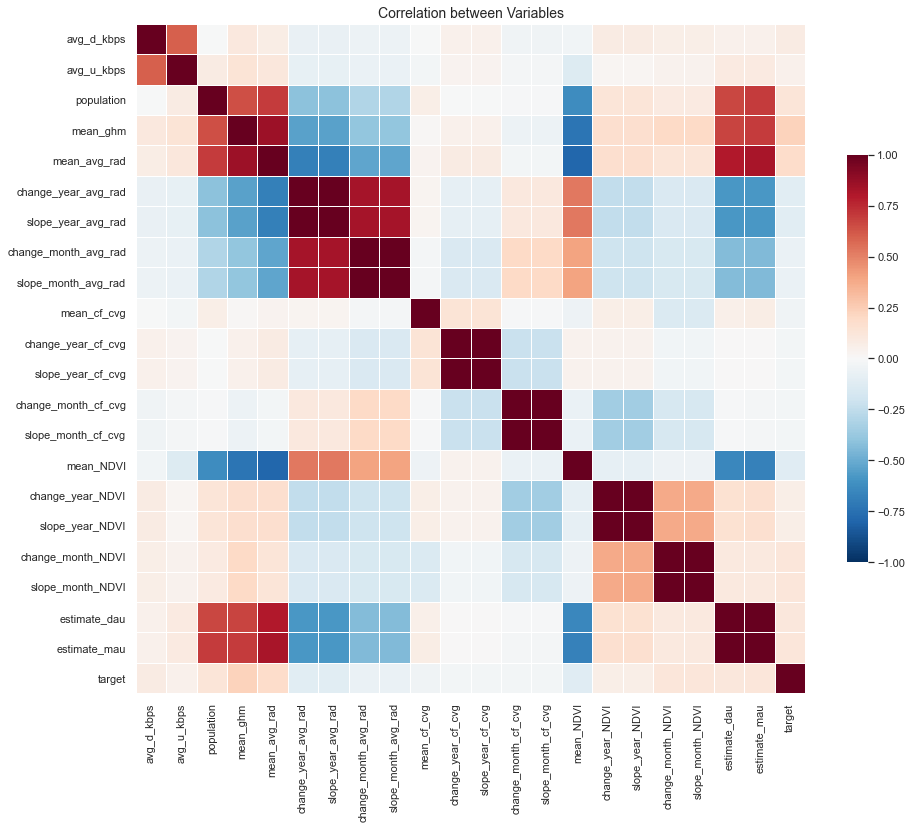

In [235]:
#Making correlations plot
fig, ax = plt.subplots(figsize=(15,15))
ax = sns.heatmap(df_num.corr(), vmax=1.0, vmin=-1.0, center=0, cmap='RdBu_r', square=True, 
                 fmt='.1f', linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"fontsize":10});
ax.set_title('Correlation between Variables',size=14);
ax.tick_params(bottom=False, left=False)
for location in ['left', 'right', 'bottom', 'top']:
    ax.spines[location].set_visible(False)

## Now we see correlation with the variables of highest correlation. 
The top predictors are all variables within the model like average radiance, Facebook users and slopes of average radiance as well as global human modification. This later provides a good check on our feature importance. 

c:\users\ucn\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



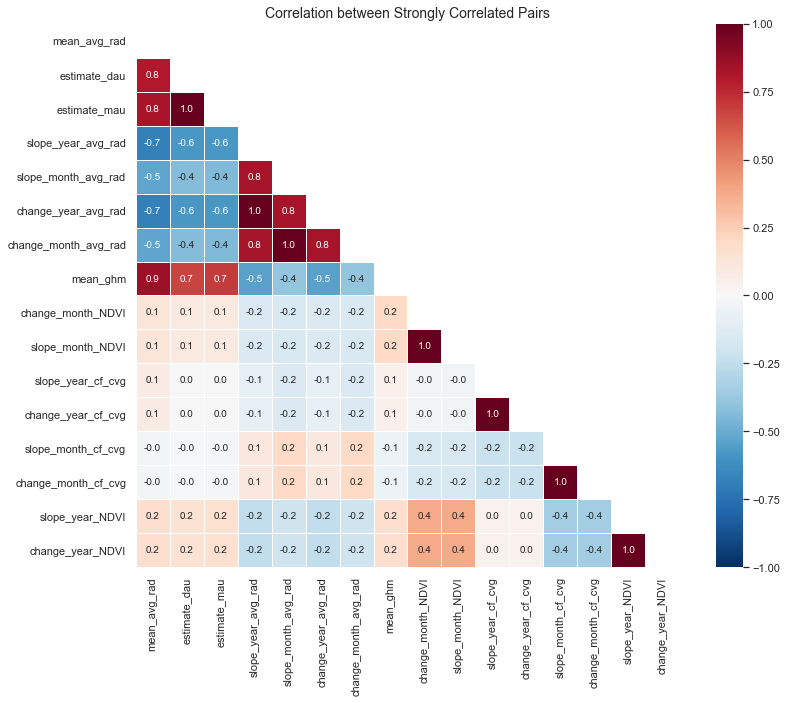

In [236]:

corr_pairs=df[num + cat].corr().unstack()

sorted_pairs = corr_pairs.sort_values(kind="quicksort")
strong_pairs = sorted_pairs[(sorted_pairs!=1) & (abs(sorted_pairs) > 0.8)]

strong_vars = [i[1] for i in strong_pairs.index] # getting variable names
strong_vars = list( dict.fromkeys(strong_vars) ) # removing duplicates

df_strong = df[strong_vars]
df_strong_corr= df_strong.corr()

mask = np.zeros_like(df_strong_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

fig ,ax = plt.subplots(figsize=(13,10))

sns.heatmap(df_strong_corr, mask=mask, annot=True, vmax=1.0, vmin=-1.0, fmt='.1f', center=0, cmap='RdBu_r', 
            square=True, linewidths=.5, annot_kws={"fontsize":10})

plt.title('Correlation between Strongly Correlated Pairs',size=14)

#ax.invert_yaxis()

ax.tick_params(bottom=False, left=False)
for location in ['left', 'right', 'bottom', 'top']:
    ax.spines[location].set_visible(False)

## Correlations with the Target
Mean global human modification has the highest correlation followed by average radiance

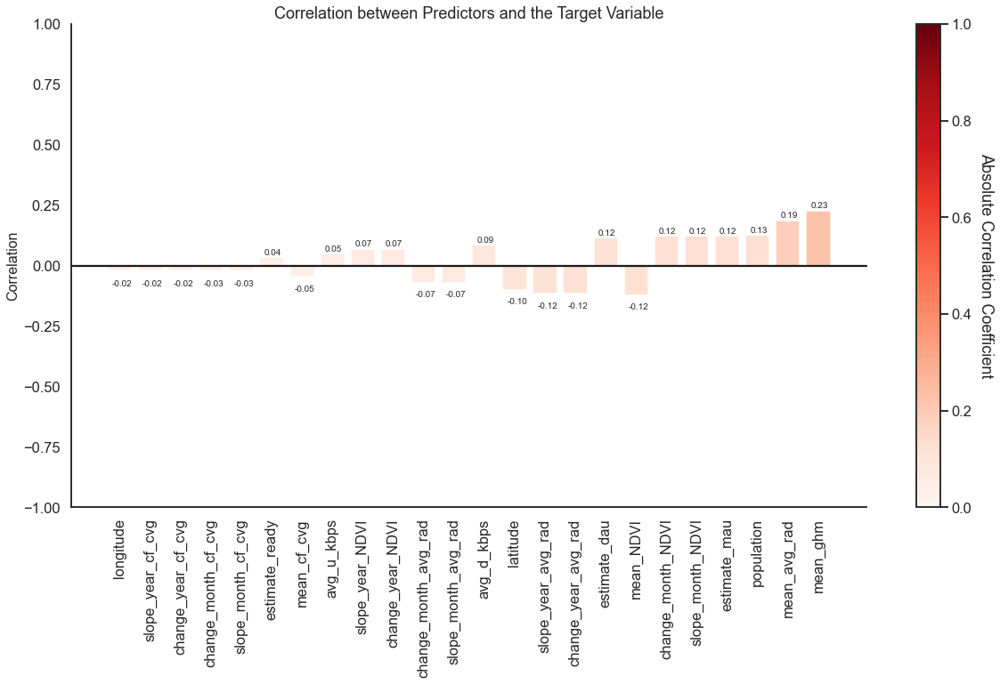

In [239]:
# Label encode the categorical variables
df_labelencoded = df.copy()

for i in cat:
    df_labelencoded[i] = df_labelencoded[i].cat.codes

corr_mat = df_labelencoded.corr().stack().reset_index(name="correlation")
corr_target=corr_mat[corr_mat['level_0']==target][1:]
corr_target=corr_target.reindex(corr_target.correlation.abs().sort_values().index)
corr_target = corr_target[:-1]

sns.set_theme(style="white", context="talk")

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(20, 10))

data_color = corr_target['correlation'].apply(abs).tolist()
#data_color_2 = [x / max(data_color) for x in data_color]

my_cmap = plt.cm.get_cmap('Reds')

sm = ScalarMappable(cmap=my_cmap, norm=plt.Normalize(0,1))
sm.set_array([])

plt.xticks(rotation=90)
ax.axhline(0, color="k", clip_on=False)
ax.set_ylim([-1,1])
ax.set_ylabel("Correlation", size=16);
plt.title('Correlation between Predictors and the Target Variable')

colors = my_cmap(data_color)
rects = ax.bar(corr_target['level_1'],corr_target['correlation'], color=colors)

for p in ax.patches:
    if p.get_height() > 0:
        h = p.get_height()+.01
    else:
        h = p.get_height()-.06
        
    ax.annotate(str('%.2f' % p.get_height()), (p.get_x()+.15, h), fontsize = 10)

ax.tick_params(bottom=False, left=False)
for location in ['right', 'top']:
    ax.spines[location].set_visible(False)

cbar = plt.colorbar(sm)
cbar.set_label('Absolute Correlation Coefficient', rotation=270,labelpad=25)

## Visualizing Distributions
##### Important disclaimer: The following plot categorizes our target variable into connected and not connected to the internet for the purposes of the plots below. As the problem we are solving is a regression problem, we are less concerned with the class imbalance that might look to be taking place here.  Currently, connected means above our 30% threshold and unconnected means below our 30% internet connectivity threshold but this may be adjusted for another country and their needs. 

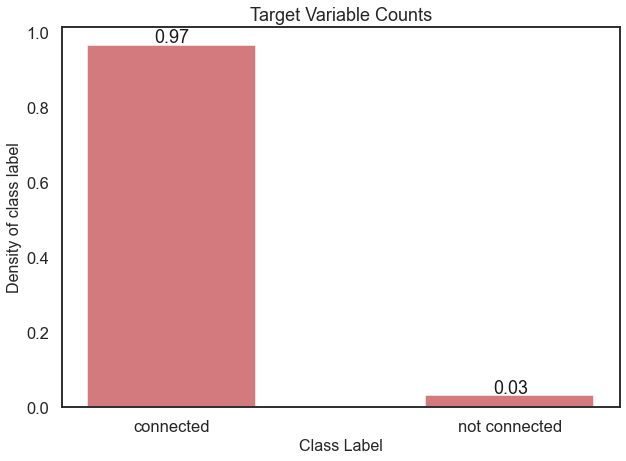

In [240]:
sns.set_theme(style="white", context="talk")
fig, ax = plt.subplots(figsize=(10,7))
sns.histplot(df,x='target_cat',stat='density', shrink=.5, fill=True, color='r');
plt.ylabel('Density of class label',size=16);
plt.xlabel('Class Label',size=16);
plt.title('Target Variable Counts',size=18);
for p in ax.patches:
    h = p.get_height()+.005
    plt.annotate(str('%.2f' % p.get_height()), (p.get_x()+.2, h), color='k');

c:\users\ucn\appdata\local\programs\python\python37\lib\site-packages\pandas\plotting\_matplotlib\tools.py:331: MatplotlibDeprecationWarning:


The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.



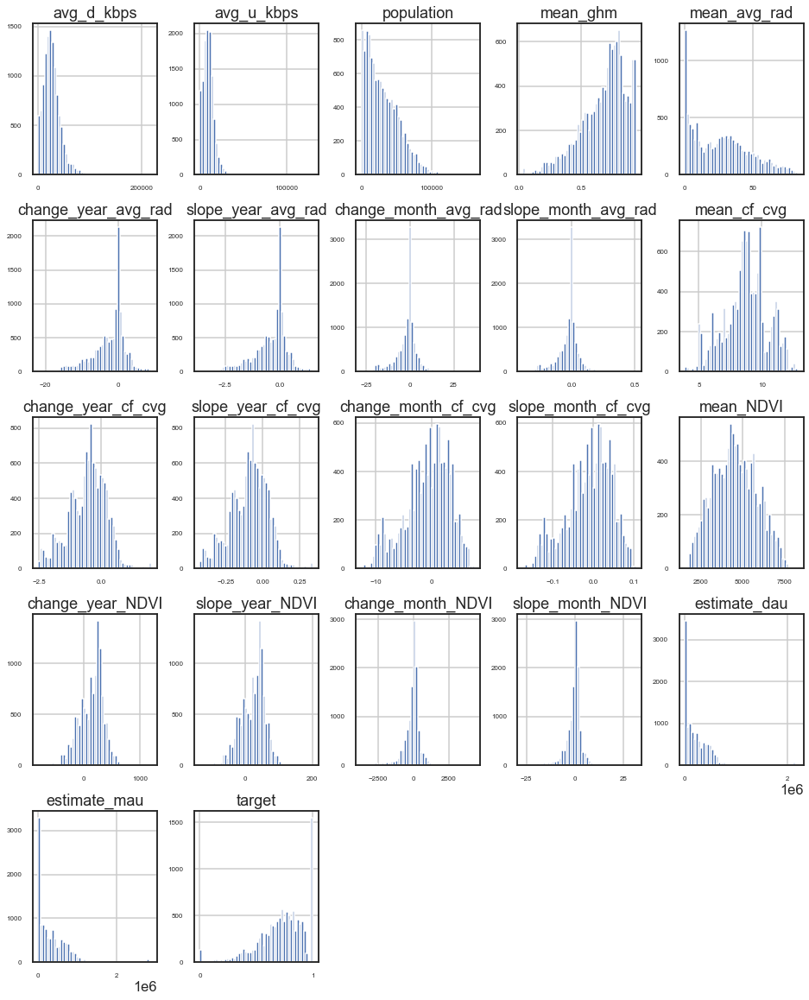

In [241]:
#Seeing the histograms for each predictor
#cloud free coverage and mean NDVI have very normal distributions while population and ghm skew left and right respectively.
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

### Categorical dist

In [20]:
fig, axes = plt.subplots(round(len(cat) / 3), 3, figsize=(12, 30))

if len(cat) == 0:
        pass
else:
    for i, ax in enumerate(fig.axes):
        if i < len(cat):
            ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
            sns.countplot(x=cat[i], alpha=0.7, data=df_cat, ax=ax)

fig.tight_layout()

NameError: name 'cat' is not defined

## Important variables vs. Target

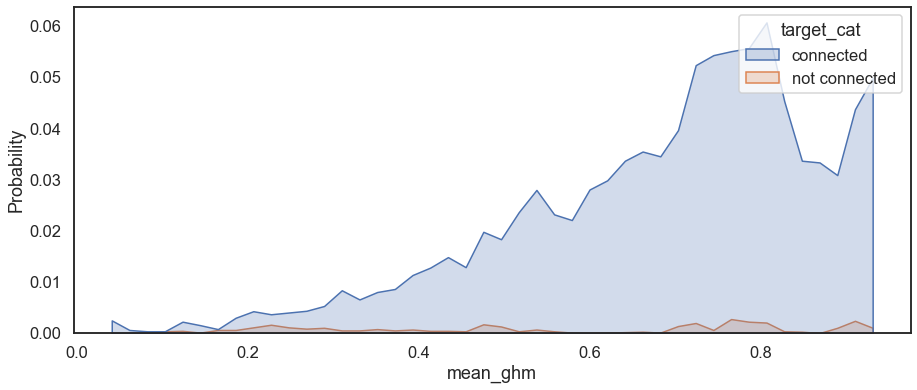

In [171]:
#Here we see the probability of connected rises when the mean ghm also rises
plt.figure(figsize=(15,6))
sns.histplot(df, x='mean_ghm', hue='target_cat', element='poly', stat='probability');

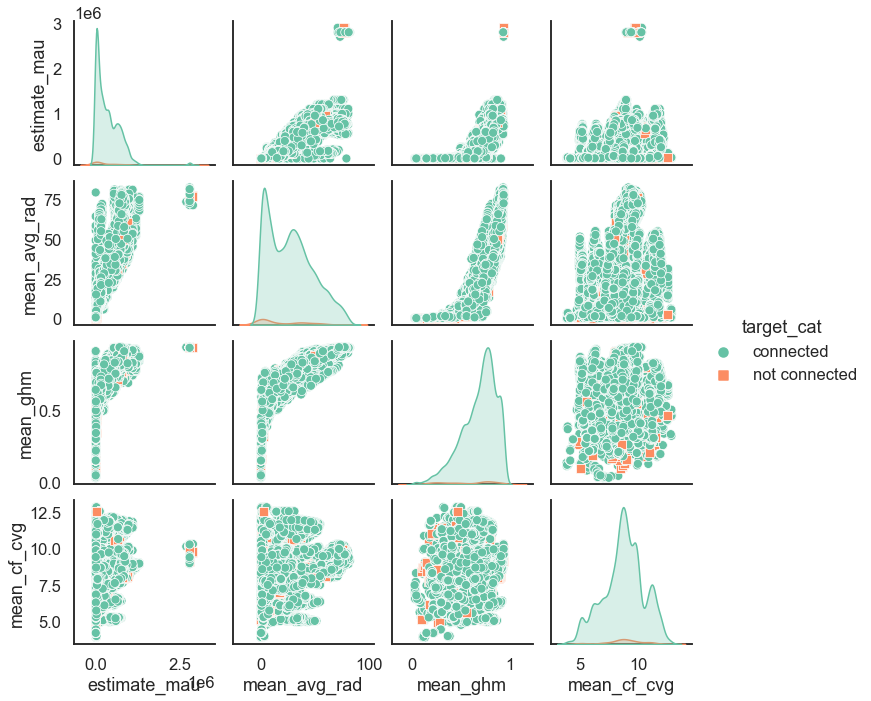

In [184]:
sns.set_theme(style="white", context="talk")
sns.pairplot(df[imp_feature + ['target_cat']],hue='target_cat',markers=["o", "s"], palette="Set2");

In [242]:
df_norm = df[['target_cat']+imp_feature]
for i in imp_feature:
    df_norm[i] = (df_norm[i]-df_norm[i].min())/(df_norm[i].max()-df_norm[i].min())
    
df_mean=df_norm.groupby('target_cat').mean().stack().reset_index(name='mean')
df_mean.rename(columns={'level_1':'imp_var'},inplace=True)
df_mean=df_mean.pivot(index='imp_var', columns='target_cat', values='mean')


df_mean2=pd.DataFrame({'connected':df_mean.connected, 'nonconnected':df_mean['not connected'], 'total':df_mean.connected+df_mean['not connected']})
df_mean2.sort_values(by='total',ascending=False, inplace=True)
df_mean2.reset_index(inplace=True)

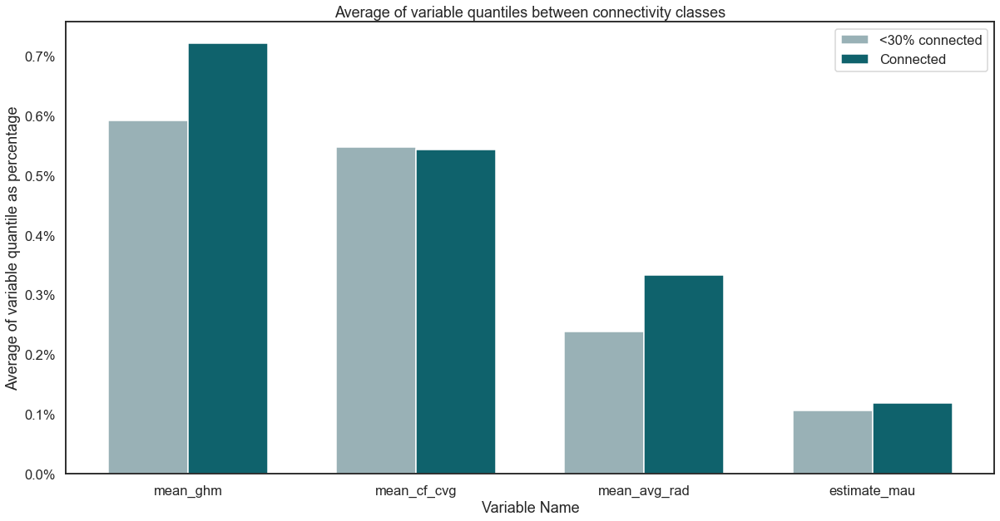

In [243]:
fig, ax = plt.subplots(figsize=(20, 10))
width = 0.35

x = np.arange(len(df_mean2.imp_var.tolist()))
xt=df_mean2.imp_var.tolist()
sns.set_color_codes("pastel")
p1=ax.bar(x-width/2, df_mean2.nonconnected, width, color="#99B1B6")
sns.set_color_codes("muted")
p2=ax.bar(x+width/2,df_mean2.connected,width, color="#0F626C")

plt.xticks(x, xt);
plt.ylabel('Average of variable quantile as percentage')
plt.xlabel('Variable Name')
plt.title('Average of variable quantiles between connectivity classes')
plt.legend((p1[0], p2[0]), ('<30% connected', 'Connected'));

fmt = '%.1f%%' 
yticks = mtick.FormatStrFormatter(fmt)
ax.yaxis.set_major_formatter(yticks)

In [225]:
df_mean2

,imp_var,connected,nonconnected,total
0,mean_ghm,0.721,0.592,1.313
1,mean_cf_cvg,0.543,0.547,1.090
2,mean_avg_rad,0.333,0.239,0.572
3,estimate_mau,0.119,0.106,0.225


In [5]:
fig = px.scatter(df, x="target", y="mean_ghm", color="target_cat", marginal_y="violin",
           marginal_x="box", trendline="ols") #, template="simple_white"
fig.show()

NameError: name 'df' is not defined

In [191]:
df_sum = df[['target_cat']+imp_feature]
for i in imp_feature:
    df_sum[i] = (df_sum[i]-df_sum[i].min())/(df_sum[i].max()-df_sum[i].min())

In [196]:
df_sum2=pd.DataFrame({'connected':df_sum.connected, 'nonconnected':df_sum['not connected'], 'total':df_sum.connected+df_sum['not connected']})
df_sum2.sort_values(by='total',ascending=False, inplace=True)

In [205]:
df_sum2

,imp_var,connected,nonconnected,total
0,mean_ghm,0.721,0.592,0.717
1,mean_cf_cvg,0.543,0.547,0.543
2,mean_avg_rad,0.333,0.239,0.330
3,estimate_mau,0.119,0.106,0.119


In [203]:
df.target_cat.value_counts()['not connected']

386

## Disclaimer
The below code will not render in the html format of the notebook. To see it, you must download and run the notebook locally.

In [244]:
#scatter plot of important features
fig = px.scatter_matrix(df, dimensions=imp_feature, color="target_cat")
fig.show()

In [245]:
for i in imp_feature:
    fig = px.scatter(df, x=i, y=target, size="population", color ='target_cat', log_x=True, size_max=13)
    fig.show()

In [246]:
for i in imp_feature:
    fig = px.box(df, y=i, color="target_cat", notched=True)
    fig.show()

## Geo Visualizations

In [247]:
for i in imp_feature:
    print(i + ':\n')
    fig = go.Figure(go.Scattermapbox(
            lat=df.latitude,
            lon=df.longitude,
            mode='markers',
            marker=go.scattermapbox.Marker(
                size=3, color=df[i],
                showscale=True,
                colorscale=px.colors.diverging.RdYlGn,
            ),
            text=['Montreal'],
        ))

    fig.update_layout(
        hovermode='closest',
        mapbox=dict(
            accesstoken=mapbox_access_token,
            style='dark',
            center = {"lat": df.latitude.mean(), "lon": df.longitude.mean()},
            bearing=0,
            pitch=0,
            zoom=3,
        )
    )

    fig.show()

estimate_mau:



mean_avg_rad:



mean_ghm:



mean_cf_cvg:

